# Wybrane zagadnienie sztucznej inteligencji

## Swarm Inteligence

Michał Maternik 126417
Piotr Błonski 225959

#### Wybrane funkcje testowe:
1. Ackley
2. Rastrigin

#### Wizualizacja funkcji ackley
Funkcja Ackley jest niewypukłą funkcją gdzie globalne optimum znajduje sie w punkcie f(0,0)=0.
Wzór: $f(x,y)=-20exp[-2.0 \sqrt{-0.5(x^2+y^2)}] - epx[0.5(cos2\pi x + cos 2\pi y)]+e + 20 $

Posiada wiele minimów lokalnych co widać na poniższej wizualizacji

#### Wizualizacja funkcji ackley


In [1]:
from TestFunctions import *
from Visualization import *
from GWO import GWO
max_verticles = 5000

In [2]:
Visualize_Test_function(ackley_function,lb=-10,ub=10,function_points=max_verticles)

#### Wizualizacja funkcji Rastrigin
$f(x) = An + \sum_{i=1}^{n} [x_i^2-A cos(2\pi x_i)] $

Posiada globalne minimum w punkcie (0,0) i minimum to wynosi 0.
Jest problematyczna ze względu na dużą przestrzeń do przeszukania jak i dużą ilość minimum lokalnych


In [3]:
Visualize_Test_function(Rastrigin_2D,lb=-10,ub=10,function_points=max_verticles)

In [4]:
from Visualization import *
from GWO import GWO
from PSO import PSO
from TCO import TCO

#### GWO - opis intucji
Algorytm GWO (Grey wolf optymaliztion) biologicznie nawiązuje do polujących szarych wilków. W naturze wilki dzielą się na rangi jednakże w tym algorytmie dzielimy wilki tylko na :Alpha, Beta, Delta, omega. Gdzie pierwsze 3 są pokolei najlepszymi znalezionymi rozwiązaniami. Wilki omega to rozwiązania które nie są Alphą/Betą/Deltą. 

Stado wilków podejmuje decyzje o przeszukaniu terenu na podstawie pozycji Alfy Bety i Delty. 
Wilki podczas polowania okrążają swoją ofiare co odwzorowuje sposób obliczania wektora ruchu złożonego z wektorów:
A - wektor obliczany obliczany na podstawie malejącego atrybutu 'a' co iteracje i losowych wektorów $r_1$ i $r_2$ w [0,1]

$\vec{A} = 2\vec{a} * \vec{r_1} - \vec{a}$

Następnie obliczany jest wektor C:

$\vec{C} = 2*\vec{r_2} $

Kierunek ruchu wilka:

$\vec{D} = $Stara_pozycja_ofiary$ *\vec{C} - $pozycja wilka$ 

Te wektory składają się na modyfikacje wektora ruchu każdego z prowadzących wilków. 
Pozostałe wilki $\omega$ poruszają się o średnią artmetyczną sumy wektorów ruchu wilków prowadzących.

Jako jedyny hiperparametr używamy granicy na której wilki polują. czyli 4 współrzędnych x1 x2 y1 y2 w naszym wypadku. 

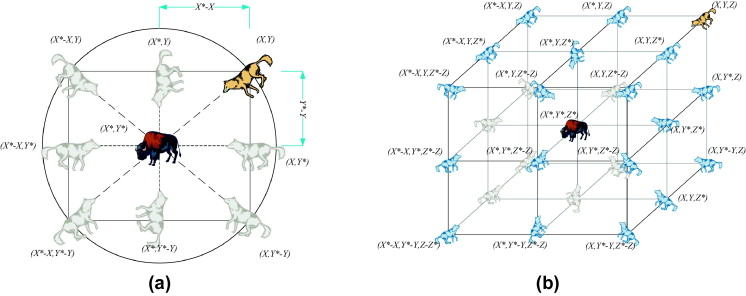

In [5]:
animate_paths(ackley_function,GWO,function_points = max_verticles,epoch=30,agents_size=100)

In [6]:
animate_paths(Rastrigin_2D,GWO,lb=-10, ub=10,function_points=max_verticles,epoch=30,agents_size=100)

#### PSO - opis intucji 

PSO czyli Particle swarm optimalization działa na następującej zasadzie. Poczatkowo cząsteczki są losowo rozrzucone i mają losowy kierunek eksploracji. Typowana jest najlepsza cząsteczka, a każda cząsteczka pamięta swoją najlepszą pozycje. 

Co iteracje ruch cząsteczek odbywa się na zasadzie złożenia wektorów: kierunek poprzedniego ruchu, osobista najlepsza pozycja, najlepsza pozycja w całym roju. Współczynniki C1 i C2 powinny maleć co iteracja a mają wpływ na to jak bardzo cząsteczka bierze pod uwagę swoją najlepszą pozycje a najlepszą pozycje roju. U nas C1 i C2 są zawsze na poziomie C1=1 i C2=2 Aby pozycja najlepsza z roju miała najwięcej wpływu. Dodatkowo c1 obniża się o 1/liczba epok co iteracje.

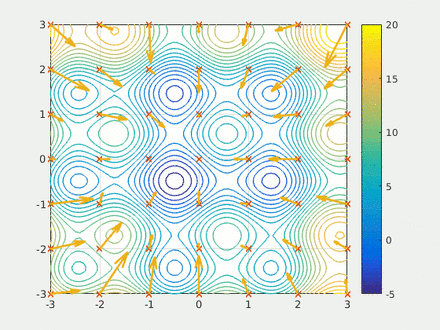

In [7]:
animate_paths(ackley_function,PSO,function_points = max_verticles,epoch=30,agents_size=100)

In [8]:
animate_paths(Rastrigin_2D,PSO,lb=-10, ub=10,function_points=max_verticles,epoch=30,agents_size=100)

#### TCO - opis intucji

W algorytmie TCO (Termite Colony Optimization), populacja termitów startuje wybranych pozycji początkowych należących do przeszukiwanej domeny funkcji i pozostawia ilość feromonów proporcjonalną do wartości funkcji celu. W kolejnych krokach osobniki przemieszczają się stochastycznie w kierunku zależnym od pozycji najlepszego z obecnych w ich otoczeniu znalezionego punktu (najlepszy to taki, w którym znajduje się największa ilość pozostawionego feromonu).

Feromony wyparowują ze współczynnikiem $\rho$, a ilość pozostawiana w kolejnej iteracji dana jest wzorem:

$\tau_i(t)=(1-\rho) \tau_i (t - 1) + \frac{1}{fit(x_i)+1}$, 
gdzie $\tau_i(t)$ jest warością feromonu pozostawionego w momencie  $t$ przez osobnika $i$

In [9]:
animate_paths(ackley_function,TCO,lb=-10, ub=10,function_points=max_verticles,epoch=30,agents_size=100)

In [10]:
animate_paths(Rastrigin_2D,TCO,lb=-10, ub=10,function_points=max_verticles,epoch=30,agents_size=100)

### Porównanie wyników na funkcjach testowych

In [11]:
from comparasion import *

#### Rastrigin

In [12]:
research(Rastrigin_2D,epoch=50,particle_size=100)

#### Ackley

In [13]:
research(ackley_function,epoch=50,particle_size=100)

#### Wnioski

1. Algorytmy rojowe są dość proste w implementacji, i skuteczne jeśli chodzi o optymalizowanie funkcji z dużą ilością minimów/maksimów lokalnych
2. Algorytm Mrówkowy (ACO) jest oparty o szukanie ścieżek w grafach natomiast jego ciągła odmiana czyli algorytm Termitowy nadaje się do optymalizowanie funkcji.
3. Niektóre artykuły naukowe mówiące o tych algorytmach nie są dość zrozumiałe za pierwszym razem.
4. Algorytm Termitowy wymaga więcej agentów niż algortym szarych wilkow czy cząsteczek
5. Wbrew pozorom algorytm szarych wilków okazał się być lepszy niż algorytm cząsteczek, pomimo że jego implementacja jest prostrza w zrozumieniu i do napisania. 
6. Podczas algorytmów optymalizacyjnych określamy granice w których algorytmy te szukają optimów.
7. Po kilku próbach zauważyliśmy ze algorytm termitowy ma tendencje do pozostawaniu w minimum lokalnym, algorytmowi cząsteczkowemu też czasem się to zdarzało. Algorytm szarych wilków wykazał największą odporność jeśli chodzi o ten problem.
8. Algorytm cząsteczkowy posiada parametry które zmieniają podejmowanie decyzji przez cząsteczki. Podczas optymalizowania zmniejszanie parametru odpowiedzialnego za udział np najlepszego osobistego wyniku w czasie spowoduje że najlepszy wynik roju będzie miał większe znaczenie.
9. Pomimo tego że obydwie funkcje testowe wykazują dużą ilość minimów lokalnych, ze względu na ich rozłożenie w funkcji Rastrigin, algorytmy TSO i PSO gorzej sobie radzą.
10. Nawet jeśli wilki (agenci) w algorytmie szarych wilków mają początkowe pozycje dalekie od globalnego minimum to świetnie sobie radzą ze swoją taktyką obkrązania minimów lokalnych.

## Źródła:

#### PSO

https://en.wikipedia.org/wiki/Particle_swarm_optimization

WZSI - Wykłady 2020 - Politechnika wrocławska 

#### GWO

https://en.wikiversity.org/wiki/Algorithm_models/Grey_Wolf_Optimizer

https://www.researchgate.net/publication/260010809_Grey_Wolf_Optimizer

#### TCO

https://ieeexplore.ieee.org/document/5507009